# Skills Analysis for Jobs at Facebook

**Names**: 

1. Nursultan Baitlessov
2. Sandip Sonawane

## 1. Introduction and Dataset Research

### 1.1 Motivation

Since the Covid-19 pandemic, 1 out of 5 US worker has considered changing job or fields [1]. In this rapidly changing technology sector, keeping yourself updated with the right skills is important. According to world economic forum, 50% of all employees will need to upskill in order to be relevant in their current position. [2] The LinkedIn career explorer allows users to choose thier current field and their target field and provides the report on how many skills overlap[3]. In this project we will try to answer below questions through our analysis and use of unsupervised learning techniques leant in STAT 430 (Unsupervised Learning) course.

### 1.2 Research Goals
    
1. What are the top skills required for different job categories?
    
2. How different job categories are related to each other and what are the shared skills?
    
3. If someone wants to switch to a different career journey, which one would be easier to switch?
   

### 1.3 References:
    
1. Han N. (2021, Nov. 11). How new learning opportunities are allowing workers to switch careers, 6abc https://6abc.com/career-tips-job-training-software-engineering-changing/11224887/
    
2. Ravin J. (2021, Sept. 14) Future of Work. Fast Company https://www.fastcompany.com/90675619/want-to-future-proof-your-career-prepare-to-invent-yourself
    
3. LinkedIn economic graph. Find new jobs with the skills you already have, LindedIn https://linkedin.github.io/career-explorer/
    
4.  Shashank K., (2019, Aug 19). Evaluate Topic Models: Latent Dirichlet Allocation (LDA)  Medium https://towardsdatascience.com/evaluate-topic-model-in-python-latent-dirichlet-allocation-lda-7d57484bb5d0

### 1.4 Dataset Information

* The dataset has 1222 Facebook job posting text out of which 787 are unique job postings. The textual data is scraped from Faceboook's career page. The links to the actual job posting is also included in one column.

Below is the data dictionary:

> category: job category ('Product Management', 'Research Scientist', 'Data and Analytics',
       'Business Development & Partnerships', 'Software Engineering',
       'People & Recruiting', 'Global Operations')
       
> company: Facebook

> title: 787 unique job titles

> description: Brief description of job and responsibilities.

> basic_qualifications: Basic qualifications required for the job

> preferred_qualifications: Preferred qualifications required for the job

> country: US

> state: ['CA', 'WA', 'TX', 'US', 'NY', 'DC', 'CO', 'PA']

> qualifications: combination of basic qualification and preferred qualifications

## 2. Data Cleaning and Data Manipulation

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('seaborn')
from sklearn.manifold import TSNE
import nltk
import re
import seaborn as sns
from nltk.stem.snowball import SnowballStemmer
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud, STOPWORDS

### 2.1 Reading Input file

In [2]:
df = pd.read_excel('job_data.xlsx')
df_raw = df.copy()
df.head()

,Unnamed: 0,category,company,link,title,location_and_id,posting_date,description,basic_qualifications,preferred_qualifications,country,state,city,job_id,country_name,alpha_2,alpha_3,un_code,qualifications
0,0,Business Intelligence,Amazon,https://www.amazon.jobs/en/jobs/987889/data-en...,Data Engineer II (L5) - Business Data Technolo...,"US, WA, Seattle | Job ID: 987889","Posted November 8, 2019",Amazon’s eCommerce Foundation (eCF) organizati...,"·\n· A desire to work in a collaborative, inte...",·\n· Industry experience as a Data Engineer or...,US,WA,Seattle,987889,United States of America,US,USA,840.0,"·\n· A desire to work in a collaborative, inte..."
1,1,Business Intelligence,Amazon,https://www.amazon.jobs/en/jobs/926586/busines...,Business Intelligence Engineer II,"US, TX, Austin | Job ID: 926586","Posted August 26, 2019",Join Amazon's Employee Resource Center (ERC) t...,· Bachelor's degree in Math/Statistics/Enginee...,"· MBA or Master’s degree in Computer Science, ...",US,TX,Austin,926586,United States of America,US,USA,840.0,· Bachelor's degree in Math/Statistics/Enginee...
2,2,Business Intelligence,Amazon,https://www.amazon.jobs/en/jobs/888114/data-en...,Data Engineering Manager,"US, WA, Seattle | Job ID: 888114","Posted July 1, 2019",The Selling Partner Fees team owns the end-to-...,"· A desire to work in a collaborative, intelle...",· Extensive experience working with AWS with a...,US,WA,Seattle,888114,United States of America,US,USA,840.0,"· A desire to work in a collaborative, intelle..."
3,3,Business Intelligence,Amazon,https://www.amazon.jobs/en/jobs/861498/data-en...,Data Engineer II (L5) - Business Data Technolo...,"US, WA, Seattle | Job ID: 861498","Posted May 20, 2019",Amazon’s eCommerce Foundation (eCF) organizati...,"·\n· A desire to work in a collaborative, inte...",·\n· Industry experience as a Data Engineer or...,US,WA,Seattle,861498,United States of America,US,USA,840.0,"·\n· A desire to work in a collaborative, inte..."
4,4,Business Intelligence,Amazon,https://www.amazon.jobs/en/jobs/1618894/busine...,Business Analyst,"US, WA, Seattle | Job ID: 1618894","Posted July 1, 2021",The BA will use data to support promotion proc...,· Bachelor’s degree in quantitative field\n· 2...,"· Master's degree in Business, Analytics, Engi...",US,WA,Seattle,1618894,United States of America,US,USA,840.0,· Bachelor’s degree in quantitative field\n· 2...


### 2.2 Dropping unnecessary columns

* We will drop the columns that will not be relevant for our analysis

In [3]:
df = df.drop(columns=['Unnamed: 0', 'location_and_id', 'posting_date', 'country_name',
                      'alpha_2', 'alpha_3', 'un_code', 'link', 'city', 'job_id'])
df.head()

,category,company,title,description,basic_qualifications,preferred_qualifications,country,state,qualifications
0,Business Intelligence,Amazon,Data Engineer II (L5) - Business Data Technolo...,Amazon’s eCommerce Foundation (eCF) organizati...,"·\n· A desire to work in a collaborative, inte...",·\n· Industry experience as a Data Engineer or...,US,WA,"·\n· A desire to work in a collaborative, inte..."
1,Business Intelligence,Amazon,Business Intelligence Engineer II,Join Amazon's Employee Resource Center (ERC) t...,· Bachelor's degree in Math/Statistics/Enginee...,"· MBA or Master’s degree in Computer Science, ...",US,TX,· Bachelor's degree in Math/Statistics/Enginee...
2,Business Intelligence,Amazon,Data Engineering Manager,The Selling Partner Fees team owns the end-to-...,"· A desire to work in a collaborative, intelle...",· Extensive experience working with AWS with a...,US,WA,"· A desire to work in a collaborative, intelle..."
3,Business Intelligence,Amazon,Data Engineer II (L5) - Business Data Technolo...,Amazon’s eCommerce Foundation (eCF) organizati...,"·\n· A desire to work in a collaborative, inte...",·\n· Industry experience as a Data Engineer or...,US,WA,"·\n· A desire to work in a collaborative, inte..."
4,Business Intelligence,Amazon,Business Analyst,The BA will use data to support promotion proc...,· Bachelor’s degree in quantitative field\n· 2...,"· Master's degree in Business, Analytics, Engi...",US,WA,· Bachelor’s degree in quantitative field\n· 2...


* We want to primarily analyze the job postings at Facebook, so let's get the Facebook results only

In [4]:
df = df[df.company=='Facebook']
df.head()

,category,company,title,description,basic_qualifications,preferred_qualifications,country,state,qualifications
12443,Product Management,Facebook,Product Manager - Consumer Software (Facebook ...,"Lead the ideation, technical development, and ...",3+ years product management experience or simi...,"Experience developing social products, technol...",US,CA,3+ years product management experience or simi...
12444,Product Management,Facebook,Product Manager - Platform (Facebook Reality L...,"Lead the ideation, technical development, and ...",4+ years product management experience with 2+...,Experience working on a successful developer a...,US,CA,4+ years product management experience with 2+...
12445,Product Management,Facebook,Product Manager,"Display strong leadership, organizational and ...",5+ years product management or related industr...,Experience of going through a full product lif...,US,CA,5+ years product management or related industr...
12446,Product Management,Facebook,Product Management Leader,"Lead a team through the ideation, technical de...",8+ years of experience in Product Management a...,Experience in a consumer focused technology co...,US,CA,8+ years of experience in Product Management a...
12447,Product Management,Facebook,Product Management Lead,"Lead a team through the ideation, technical de...",6+ years of experience in Product Management a...,Experience in a consumer focused technology co...,US,CA,6+ years of experience in Product Management a...


* The number of all Facebook job postings is 1222

In [5]:
df.shape

(1222, 9)

### 2.3 Dropping duplicate job qualifications

- There are some duplicate job qualifications and for the vectorization purposes later, lets drop these duplicates.

In [6]:
df = df.drop_duplicates(subset='qualifications', keep="last")
df = df.reset_index(drop=True)

In [7]:
df.shape

(727, 9)

* Now the number of job postings, which we will analyze, decreased to 727.

In [8]:
df.isna().sum()

category                     0
company                      0
title                        0
description                  0
basic_qualifications         0
preferred_qualifications    77
country                      0
state                        0
qualifications               0
dtype: int64

- Originally, there were 19 columns out of which only 9 are useful. Hence, the other columns are dropped.

- There are no missing values except 77 preferred qualifications. Since these jobs do not have provided preferred qualifications, and we are combining all qualifications in qualifications column, it won't affect our analysis.

### 2.4 Merge description and qualifications columns

* We merge description and qualifications columns to get one column with all of the information provided for every single job opening

In [9]:
df["information"] = df["description"] + df["qualifications"]
df.head()

,category,company,title,description,basic_qualifications,preferred_qualifications,country,state,qualifications,information
0,Product Management,Facebook,Product Manager - Consumer Software (Facebook ...,"Lead the ideation, technical development, and ...",3+ years product management experience or simi...,"Experience developing social products, technol...",US,CA,3+ years product management experience or simi...,"Lead the ideation, technical development, and ..."
1,Product Management,Facebook,Product Manager - Platform (Facebook Reality L...,"Lead the ideation, technical development, and ...",4+ years product management experience with 2+...,Experience working on a successful developer a...,US,CA,4+ years product management experience with 2+...,"Lead the ideation, technical development, and ..."
2,Product Management,Facebook,Product Manager,"Display strong leadership, organizational and ...",5+ years product management or related industr...,Experience of going through a full product lif...,US,CA,5+ years product management or related industr...,"Display strong leadership, organizational and ..."
3,Product Management,Facebook,Product Management Leader,"Lead a team through the ideation, technical de...",8+ years of experience in Product Management a...,Experience in a consumer focused technology co...,US,CA,8+ years of experience in Product Management a...,"Lead a team through the ideation, technical de..."
4,Product Management,Facebook,Product Management Lead,"Lead a team through the ideation, technical de...",6+ years of experience in Product Management a...,Experience in a consumer focused technology co...,US,CA,6+ years of experience in Product Management a...,"Lead a team through the ideation, technical de..."


### 2.5 Data pre-processing for Hierachical Agglomerative Clustering model - Vectorizing the text corpus (TF-IDF vectorization)

* We need to remove stopwords from text, let's use nltk's English stopwords.

In [10]:
stpwords = stopwords.words('english')

In [11]:
new_stopwords = ['age', 'sexual', 'gender', 'disability', 'race', 'religion', 'belief', 'opportunity', 'employer',
                 'discrimate', 'opportunity', 'equal', 'national', 'origin', 'national', 'veteran', 'orientation',
                 'legally', 'problems', 'solutions', 'processing', 'state', 'peer', 'environment', 'proven',
                 'visit', 'https', 'status', 'jobs', 'amazon', 'diverse', 'individual', 'protected', 'discriminate',
                 'disabilities', 'individuals', 'workplace', 'inclusive', 'please', 'us', 'en', 'new', 'committed',
                 'demonstrated', 'minimum', 'current', 'system', 'pattern', 'fundamental',
                 'strong', 'degree', 'year', 'one', 'least', 'identity', 'accommodation', 'years', 'e g', 'ability',
                 'request', 'basis', 'g', 's', 'record', 'experience', 'working', 'etc', 'e', 'knowledge', 'using', 'team',
                 'design', 'bachelor', 'solution', 'field', 'related', 'work', 'hands', 'building', 'relevant',
                 'industry', 'equivalent', 'business', 'problem', 'skill', 'skills', 'application', 'track', 'similar', 'plus',
                 'including', 'professional', 'c c', 'reliability', 'role', 'etl', 'fluid', 'messenger', 'whatsapp']

for word in new_stopwords:
        stpwords.append(word)

* Below is the function to get the clean tokens from the text, so it:
    * Removes punctuation, characters and numbers from the given text
    * Uses lemmatization to retain the meaning of the words
    * And if the word is not in stopwords, the function will add it the output, which is the list of clean words
    
* This function will be used as a tokenizer later in a TfidfVectorizer function

In [12]:
def tokenization_and_lemmatization(text):
    # Remove punctuation, characters and numbers
    text = re.sub(r"[^a-zA-Z]", " ", text)
    
    # Tokenize text
    tokens = word_tokenize(text)
    
    # We will use lemmatization instead of stemming in order to retain meaning of the words
    lemmatizer = WordNetLemmatizer()

    clean_tokens = []
    for word in tokens:
        clean_tok = lemmatizer.lemmatize(word).lower().strip()

        if clean_tok not in stpwords:
            clean_tokens.append(clean_tok)

    return clean_tokens

* Let's convert the information column to the list structure to fit the TfidfVectorizer to this data

In [13]:
data_information = df.loc[:, 'information'].tolist()
#Example of the first two information entries
data_information[:2]

['Lead the ideation, technical development, and launch of innovative products\nEstablish shared vision across the company by building consensus on priorities leading to product execution\nDrive product development with a team of world-class engineers and designers\nIntegrate usability studies, research and market analysis into product requirements to enhance user satisfaction\nDefine and analyze metrics that inform the success of products\nUnderstand Facebook’s strategic and competitive position and deliver products that are recognized best in the industry\n3+ years product management experience or similar experience\nTechnical experience with analytical tools, methodologies, and design\n3+ years of experience in developing consumer products such as mobile phones, smart home, wearable technologies and platforms, Media products or AR/VR products\nExperience developing social products, technologies and platforms\nExperience delivering products with technology introduction\nBA/BS or equiv

* Let's now convert a collection of raw documents to a matrix of TF-IDF features with the maximum number of words of 1000 and at most 2-gram

In [24]:
tfidf_model_information = TfidfVectorizer(
    max_df=0.99, # max_df : maximum document frequency for the given word
    max_features=1000, # max_features: maximum number of words
    min_df=0.01, # min_df : minimum document frequency for the given word
    use_idf=True, # use_idf: if not true, we only calculate tf
    tokenizer=tokenization_and_lemmatization, # the function that was created earlier
    ngram_range=(1,2) # ngram_range: (min, max), eg. (1, 2) including 1-gram, 2-gram
)

* Fit the TfidfVectorizer to our data and get the document term matrix

In [25]:
# Fit the TfidfVectorizer to our data
tfidf_matrix_information = tfidf_model_information.fit_transform(data_information)
tfidf_matrix_information.shape

(727, 1000)

* Get the list of feature names

In [26]:
# words
tf_selected_words_info = tfidf_model_information.get_feature_names()
tf_selected_words_info[:5]

['able', 'abuse', 'academic', 'access', 'account']

* Convert the document term matrix to a dense ndarray representation of the matrix

In [27]:
# data matrix
tfidf_matrix_np_info = tfidf_matrix_information.toarray()
tfidf_matrix_np_info

array([[0.        , 0.        , 0.        , ..., 0.09244854, 0.1041945 ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.08762705, 0.09876043,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.09642235, 0.10867321,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ]])

Below we can see, after removing stopwords, there are less solid vertical lines. Solid vertical lines in below plot represent words that are repeated in almost all documents.

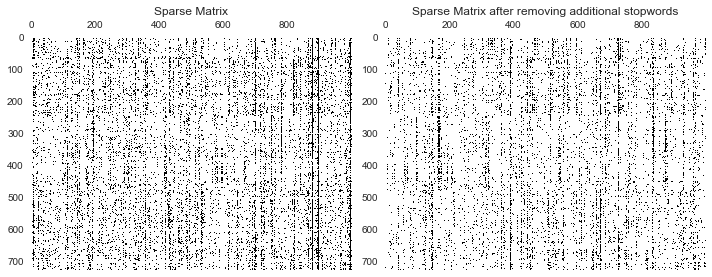

<Figure size 576x396 with 0 Axes>

In [29]:
plt.figure(figsize=[10,5])

plt.subplot(121)
plt.spy(tfidf_matrix_np_info_with_stopwords)
plt.title('Sparse Matrix')

plt.subplot(122)
plt.spy(tfidf_matrix_np_info)
plt.title('Sparse Matrix after removing additional stopwords')
plt.tight_layout()
plt.show()

### 2.5 Data pre-processing for LDA model

# Sandip your pre-processing part comes here

## 3. Basic Descriptive Analytics

### 3.1 Visualizing distribution of pre-assigned class labels

* We plot the distribution of pre-assigned class labels as a histogram below

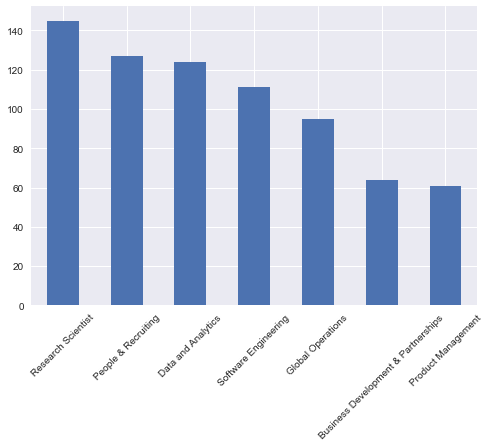

In [30]:
df.category.value_counts().plot(kind='bar')
plt.xticks(rotation=45)
plt.show()

* From this histogram we can see that the most job postings in Facebook were for Research Scientist position (about 145 job postings) and the least job postings were for Product Management position (about 60 job postings)

In [31]:
pd.DataFrame(tfidf_matrix_np_info, columns=tf_selected_words_info).describe()

,able,abuse,academic,access,account,accountability,achieve,achieving,acoustic,across,...,well,wide,wide variety,willingness,within,workflow,workforce,world,world class,writing
count,727.000000,727.000000,727.000000,727.000000,727.000000,727.000000,727.000000,727.000000,727.000000,727.000000,...,727.000000,727.000000,727.000000,727.000000,727.000000,727.000000,727.000000,727.000000,727.000000,727.000000
mean,0.003210,0.003566,0.004052,0.002917,0.004001,0.003374,0.006440,0.003067,0.003582,0.032864,...,0.010863,0.007637,0.003363,0.003321,0.015147,0.008462,0.006070,0.008295,0.005972,0.004275
std,0.018822,0.028843,0.028269,0.018037,0.022181,0.018249,0.026429,0.017762,0.035024,0.039749,...,0.027688,0.028273,0.019515,0.018617,0.029919,0.036174,0.037389,0.027021,0.023160,0.020880
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.026211,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.054102,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,0.162746,0.378535,0.515461,0.178323,0.281860,0.166089,0.186116,0.202696,0.563874,0.199862,...,0.181367,0.230297,0.266122,0.148663,0.187013,0.394803,0.423547,0.300522,0.135869,0.215324


### 3.2 Visualizing word cloud for all job categories

* Create the function to plot word cloud for different positions

In [32]:
categories = df.category.unique()
categories

array(['Product Management', 'Research Scientist', 'Data and Analytics',
       'Business Development & Partnerships', 'Software Engineering',
       'People & Recruiting', 'Global Operations'], dtype=object)

In [33]:
def plot_wordcloud(text):
    corpus = " ".join(text)
    # plot wordcloud
    stopwords = set(STOPWORDS)
    wordcloud = WordCloud(width = 800, height = 800,
                    background_color ='white',
                    stopwords = stpwords,
                    min_font_size = 10).generate(corpus)
    return wordcloud

* Plot word cloud for different positions

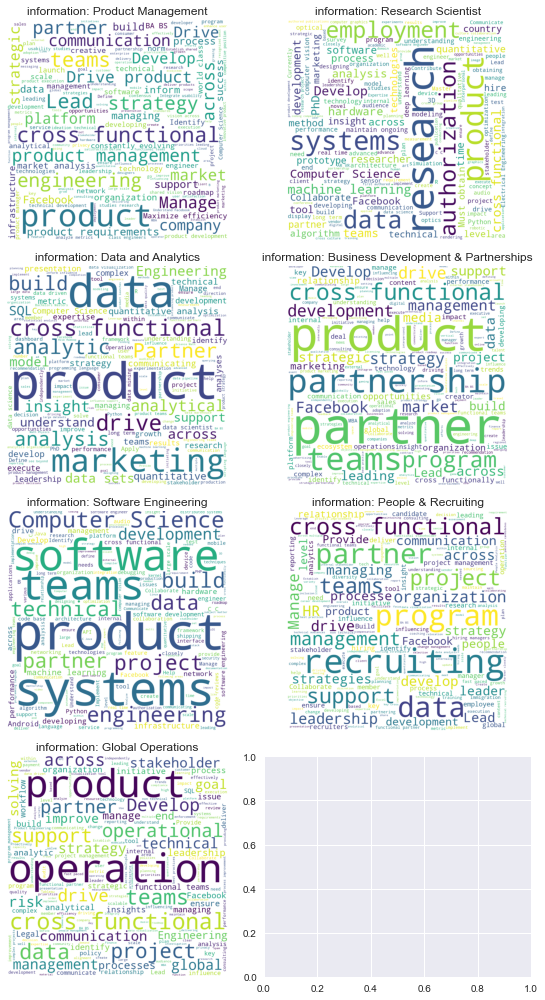

In [35]:
num_row = 4
num_col = 2

# get a segment of the dataset
num = num_row*num_col

# plot images
fig, axes = plt.subplots(num_row, num_col, figsize=(4*num_col,3.5*num_row))

for i in range(num_row* num_col):
    if i == 7:
        continue
    try:
        wordcloud = plot_wordcloud(df.information[df.category==categories[i]])
        ax = axes[i//num_col, i%num_col]
        ax.imshow(wordcloud)
        ax.axis("off")
        ax.set_title(f'information: {categories[i]}')
    except:
        pass

plt.tight_layout()
plt.show()

## 4. Dataset Scaling Decisions

Since we have used tf-idf vectorizer to convert raw text into vectorized form, all of the values in all of the columns have a range between 0 and 1. Also for count vectorizer, if we perform scaling, it results in loss of interpretability. Hence we do not need to perform scaling.

## 5. Clusterability and Clustering Structure Questions

### 5.1 t-SNE Plot with pre-assigned Category type Labels

* Below are the plots for t-SNE scatterplots for our document term matrix using three different perplexity values and random states. The points are color-coded by the pre-assigned category type labels.

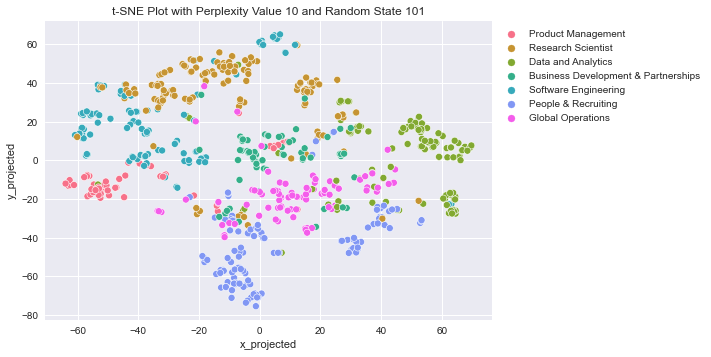

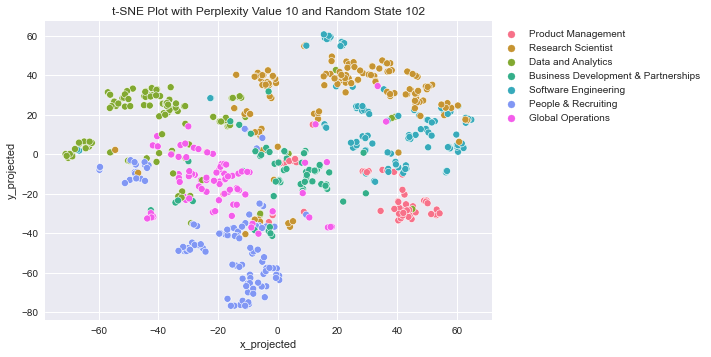

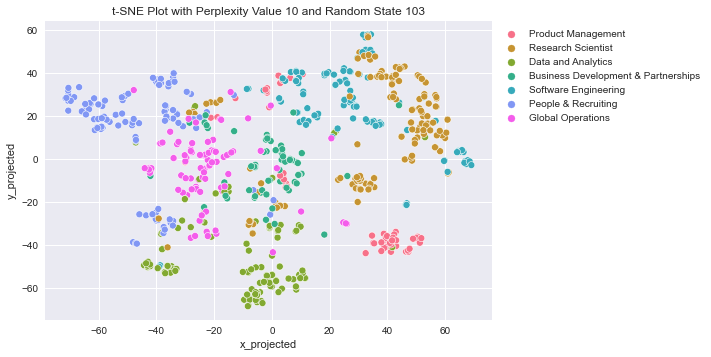

--------------------------------------------


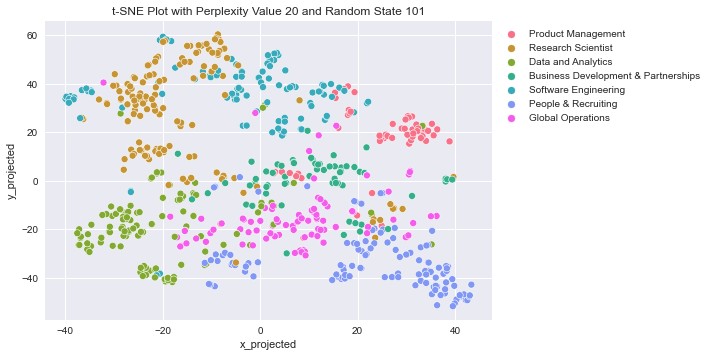

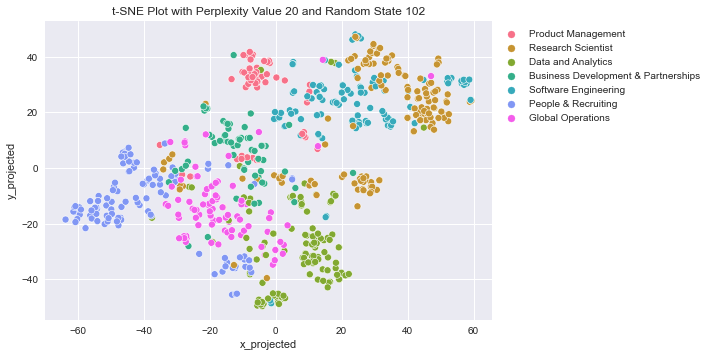

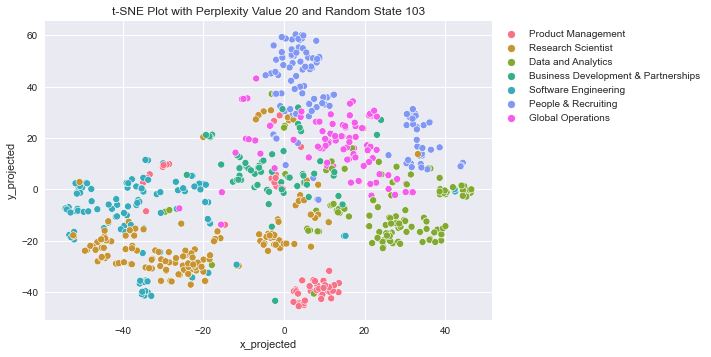

--------------------------------------------


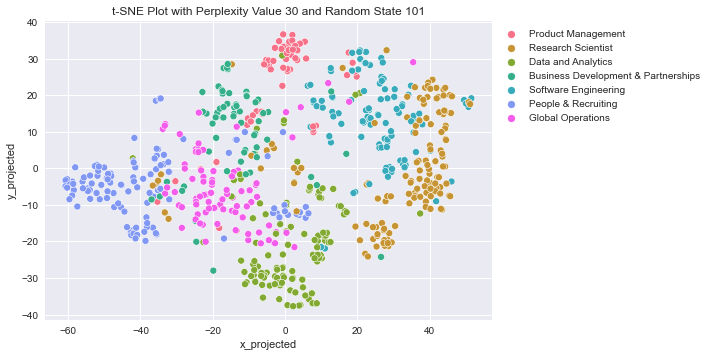

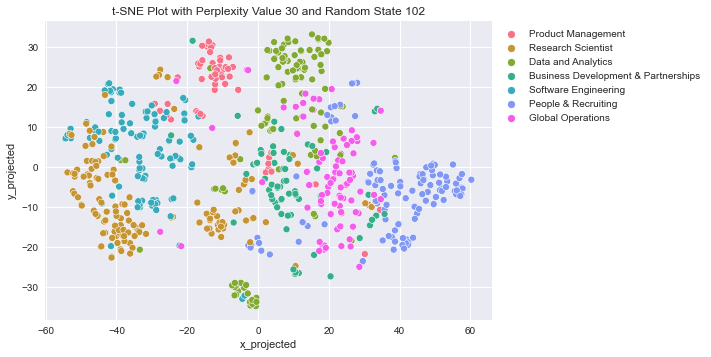

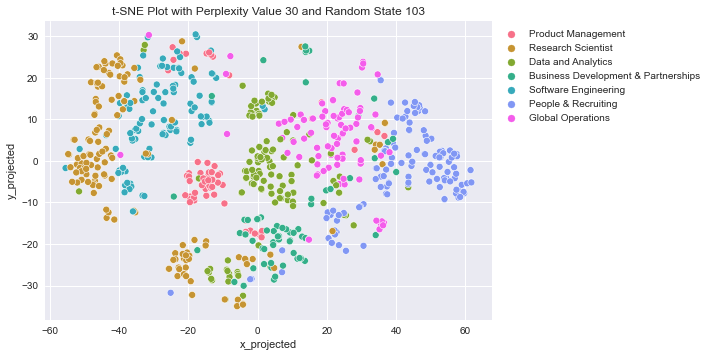

--------------------------------------------


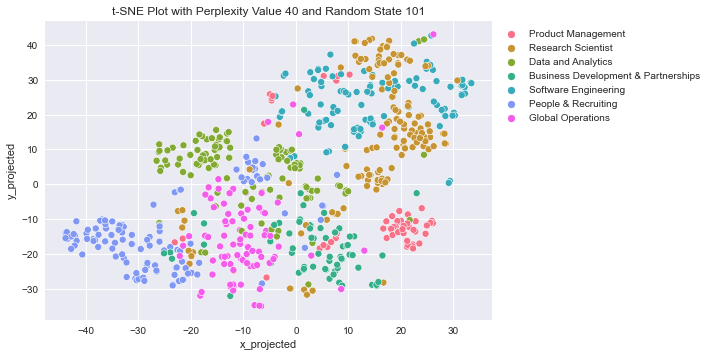

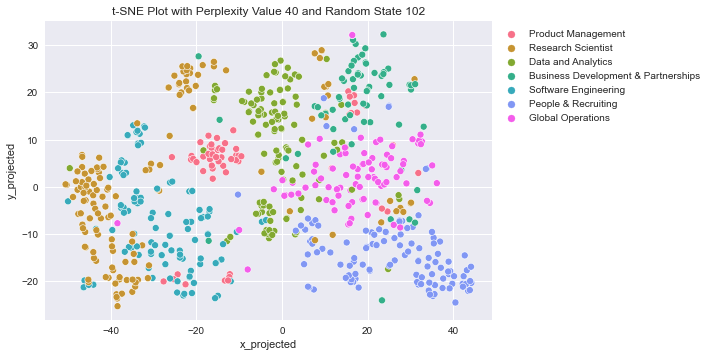

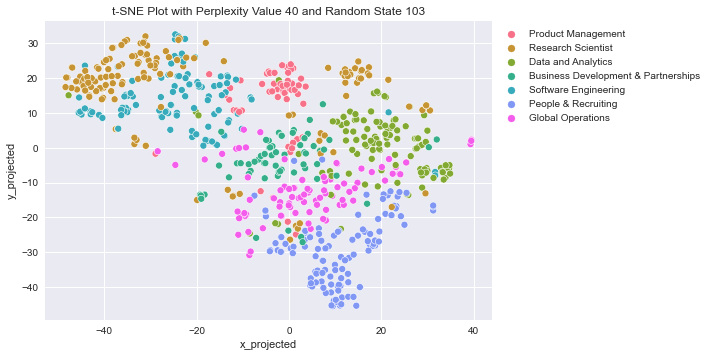

--------------------------------------------


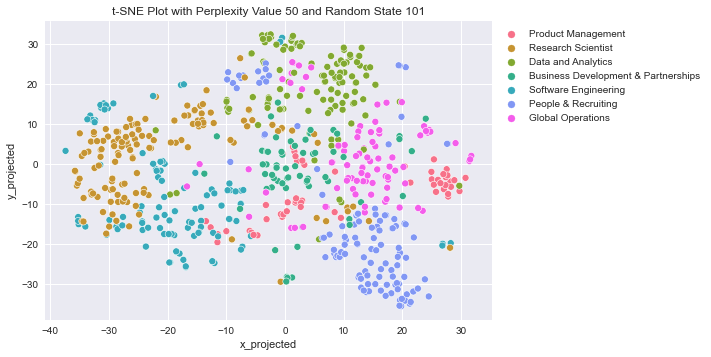

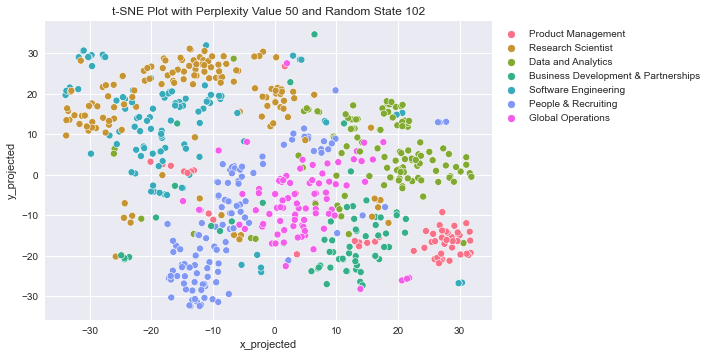

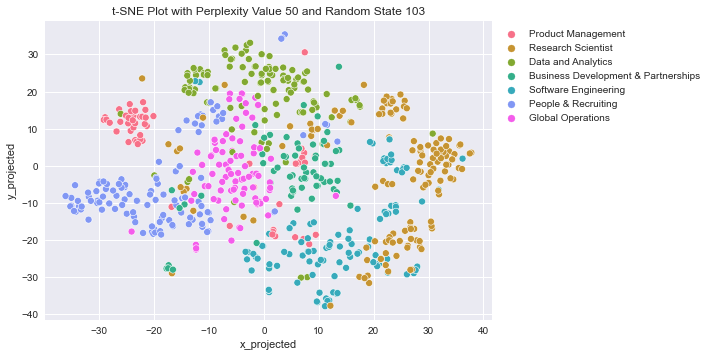

--------------------------------------------


In [273]:
for perp in [10, 20, 30, 40, 50]:
    for rs in [101,102,103]:
        tsne = TSNE(n_components=2, perplexity=perp, random_state=rs)
        data_tsne = tsne.fit_transform(tfidf_matrix_np_info)
        df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
        df_combo = pd.concat([df, df_tsne], axis=1)
        sns.scatterplot(x='x_projected',y='y_projected', hue='category', palette=sns.color_palette("husl", 7), data=df_combo)
        plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(perp, rs))
        plt.legend(bbox_to_anchor=(1,1))
        plt.show()
    print('--------------------------------------------')

### 5.2 T-SNE plot that that provides the best representation of the clustering structure

* All of the t-SNE plots provide pretty much the same clustering structure. We believe that the t-SNE plot with perplexity value of 20 and a random state of 103 provides the best representation of the clustering structure

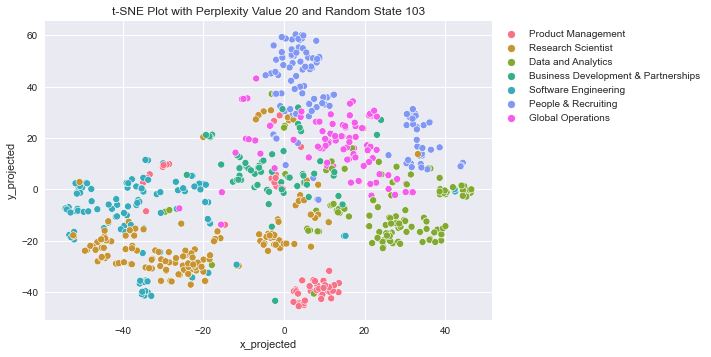

In [274]:
perp = 20
rs = 103
tsne = TSNE(n_components=2, perplexity=perp, random_state=rs)
data_tsne = tsne.fit_transform(tfidf_matrix_np_info)
df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
df_combo = pd.concat([df, df_tsne], axis=1)
sns.scatterplot(x='x_projected',y='y_projected', hue='category', palette=sns.color_palette("husl", 7), data=df_combo)
plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(perp, rs))
plt.legend(bbox_to_anchor=(1,1))
plt.show()

### 5.3 Analysis suggests that the dataset is clusterable

* By looking at the t-SNE plots above, we can clearly see the underlying clustering structure with at least 4 main clusters. For example, if we look at the t-SNE plot with perplexity value of 20 and random state of 103, we can see these clusters as the following:
    * 1) The cluster containing mostly Product Management job openings below
    * 2) The cluster containing mostly People & Recruting job openings at the top
    * 3) Big cluster on the left of the plot
    * 4) Another big cluster on the right of the plot

### 5.4 Describe the Underlying Clustering Structure of the Dataset

* a) As was mentioned in the previous section, the data has at least 4 main clusters. However, in fact, there could be more clusters, as according to the t-SNE plot, the presence of sub-clusters in the main clusters is evident. We could say that if we count all of the sub-clusters, in total there could be about 9 sub-clusters.
* b) The shape of the underlying 4 main clusters and potential 9 sub-clusters is ellipsoidal.
* c) If we look at the main 4 clusters, then they are not balanced in size, because the clusters at the bottom and at the top are smaller than the clusters at the left and at the right. However, if we look at the sub-clusters, we can say that all of them are almost balanced in size.
* d) If we look at the main 4 clusters, they do not overlap much with each other. However, we are interested in the sub-clusters' structure as well, and we can see that the sub-clusters overlap a lot with each other.

## 6. Algorithm Selection Motivation

- Based on t-SNE plot, we can see for the same job category, there are small clusters at different proximity. Hence, this suggests that a hierarchical clustering algorithm may be able to identify such levels.

- Also, we want to understand which are the dominant words in each of the job category to understand the top skills that are required. This suggests that using Latent Dirichlet Algorithms (LDA) can be a good option.

## 7. Clustering Algorithm 1 (Hierarchical Agglomerative Clustering)



### 7.1. Parameter Selection

In [263]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import adjusted_rand_score, silhouette_samples, silhouette_score
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import linkage, dendrogram

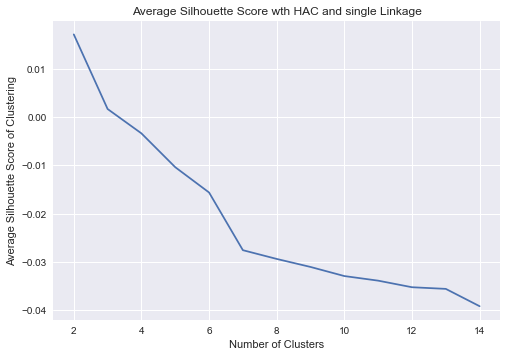

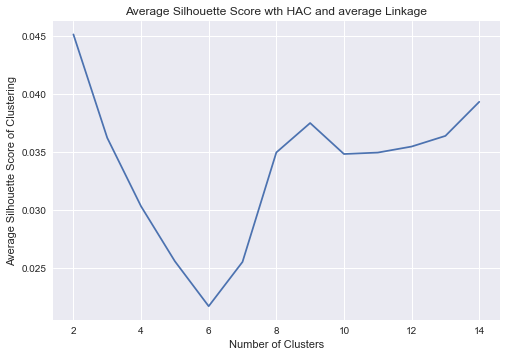

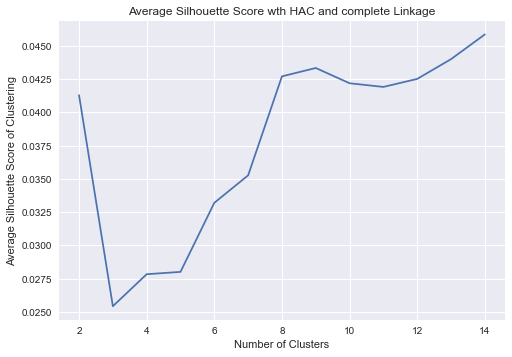

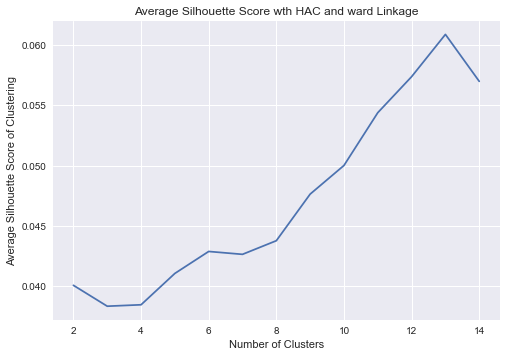

In [264]:
for link in ['single', 'average', 'complete', 'ward']:
    avg_ss=[]
    for k in [2,3,4,5,6,7,8,9,10,11,12,13,14]:
        #First, designate the HAC linkage function, and the number of clusters you want to extract from the resulting dendrogram
        hac = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage=link)
        Y_pred = hac.fit_predict(tfidf_matrix_np_info)
        avg_ss.append(silhouette_score(tfidf_matrix_np_info, Y_pred))
        
    plt.plot([2,3,4,5,6,7,8,9,10,11,12,13,14], avg_ss)
    plt.title('Average Silhouette Score wth HAC and %s Linkage'%link)
    plt.xlabel('Number of Clusters')
    plt.ylabel('Average Silhouette Score of Clustering')
    plt.show()

How many clusters? Which linkage to choose? - complete

## Hierarchical Agglomerative Clustering with Single Linkage

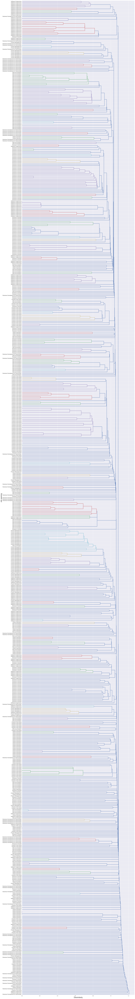

In [265]:
dm = pdist(tfidf_matrix_np_info, metric='euclidean')
Z = linkage(dm, method='single')

fig, ax = plt.subplots(figsize=(22, 200))
d = dendrogram(Z, orientation='right', labels=df['category'].array, ax=ax)
ax.set_xlabel('Dissimilarity', fontsize=18)
ax.set_ylabel('Job opening', fontsize=18)
plt.yticks(fontsize=12)
plt.show()

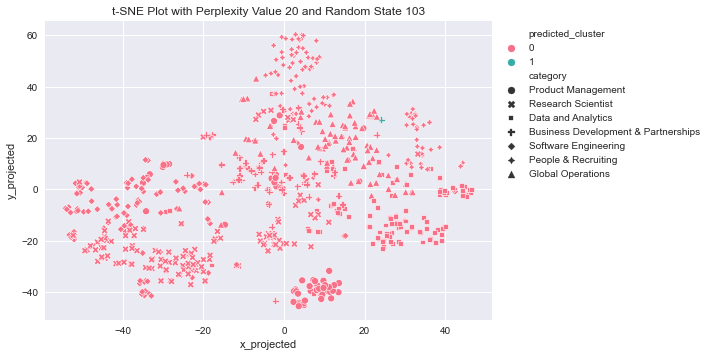

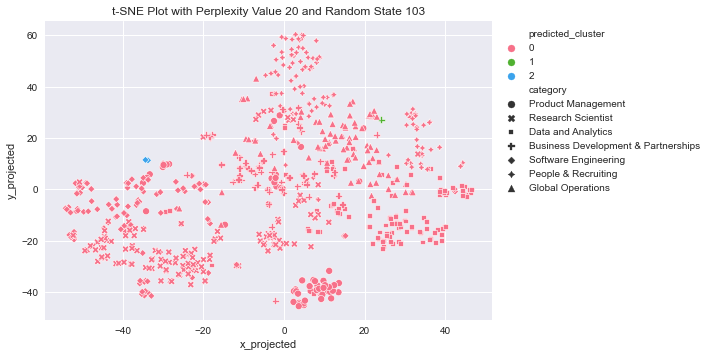

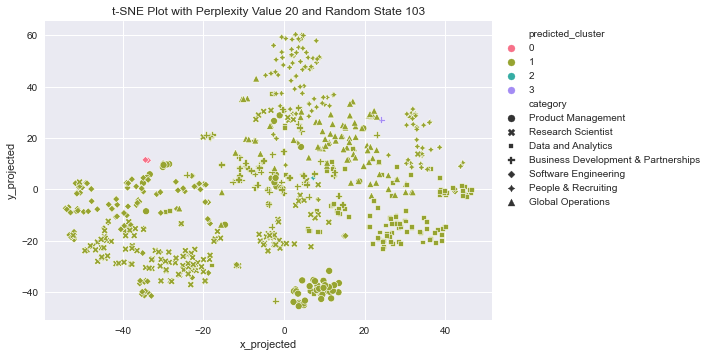

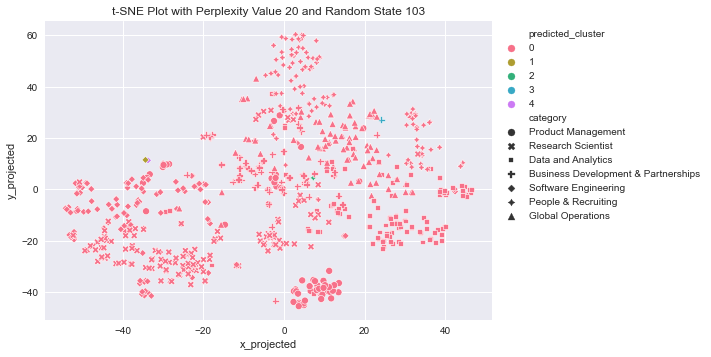

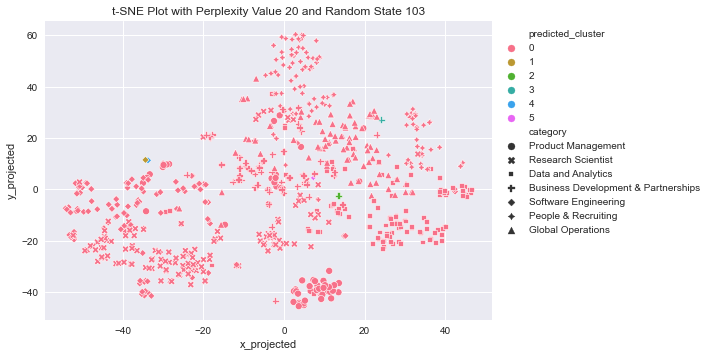

...

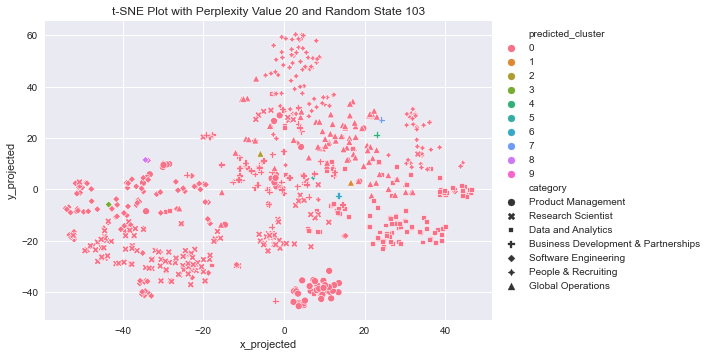

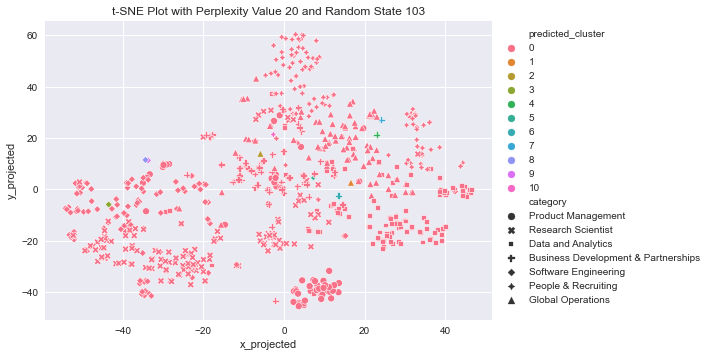

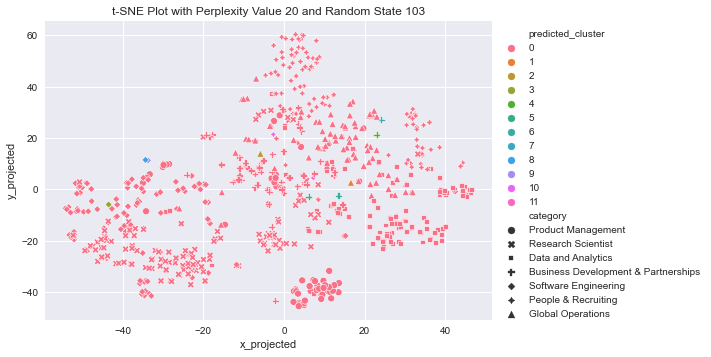

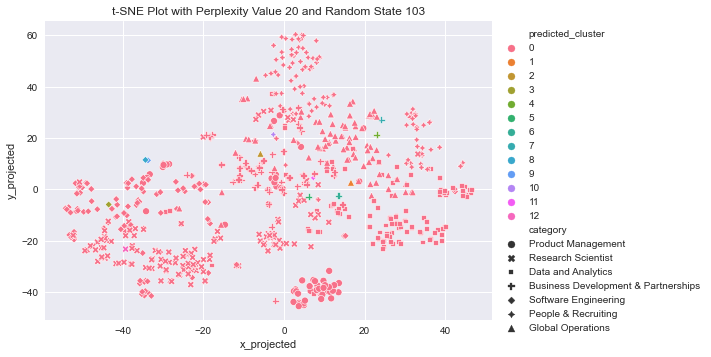

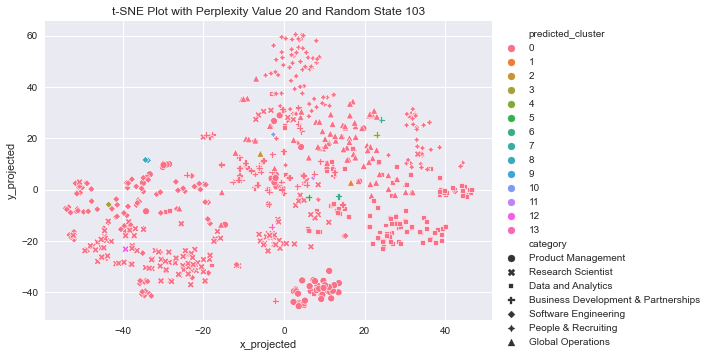

In [266]:
tsne = TSNE(n_components=2, perplexity=20, random_state=103)
data_tsne = tsne.fit_transform(tfidf_matrix_np_info)
df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
df_combo = pd.concat([df, df_tsne], axis=1)
for k in range(2,15):
    #Clustering from dendrogram with k clusters
    hac = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='single')
    df_combo['predicted_cluster'] = hac.fit_predict(tfidf_matrix_np_info)
    
    #Map the resulting cluster labels onto our chosen t-SNE plot
    sns.scatterplot(x='x_projected',y='y_projected', hue='predicted_cluster', palette=sns.color_palette("husl", k), style = df['category'], data=df_combo)
    plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(20, 103))
    plt.legend(bbox_to_anchor=(1,1))
    plt.show()

## Hierarchical Agglomerative Clustering with Average Linkage

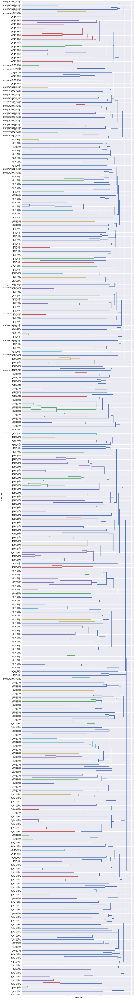

In [267]:
dm = pdist(tfidf_matrix_np_info, metric='euclidean')
Z = linkage(dm, method='average')

fig, ax = plt.subplots(figsize=(22, 200))
d = dendrogram(Z, orientation='right', labels=df['category'].array, ax=ax)
ax.set_xlabel('Dissimilarity', fontsize=18)
ax.set_ylabel('Job opening', fontsize=18)
plt.yticks(fontsize=12)
plt.show()

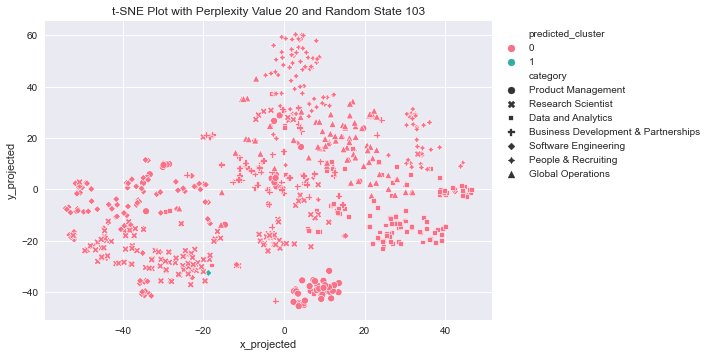

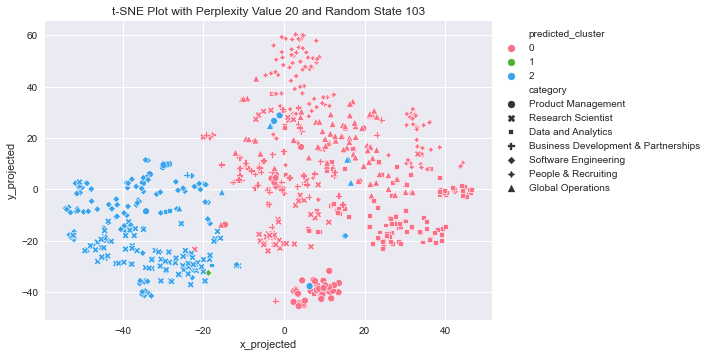

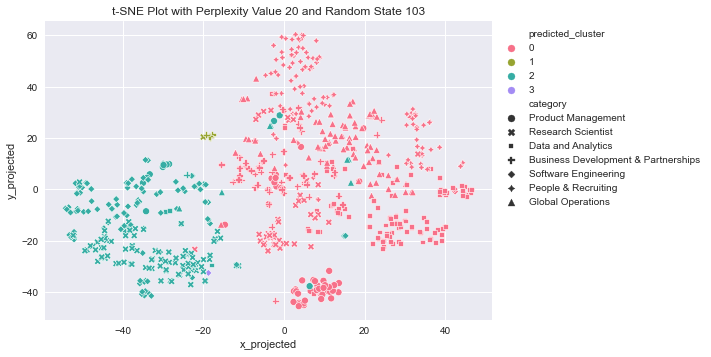

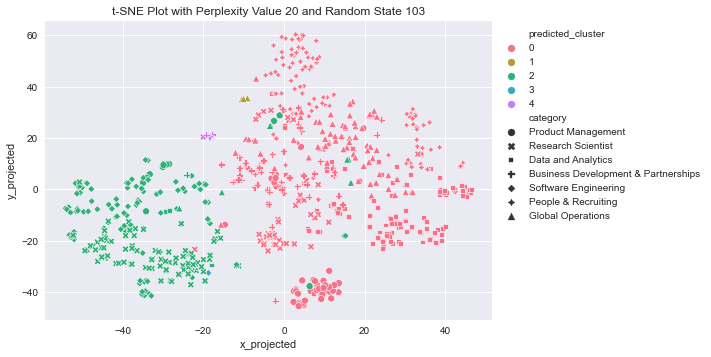

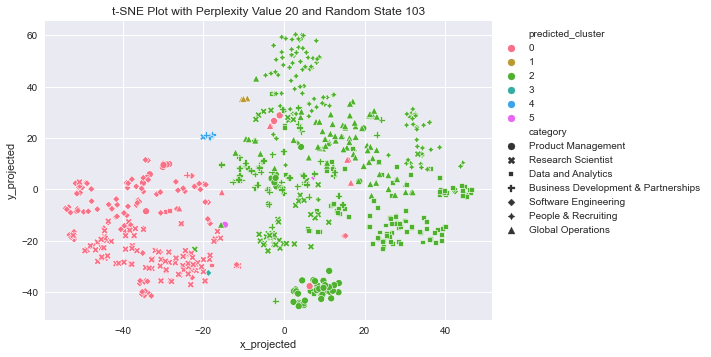

...

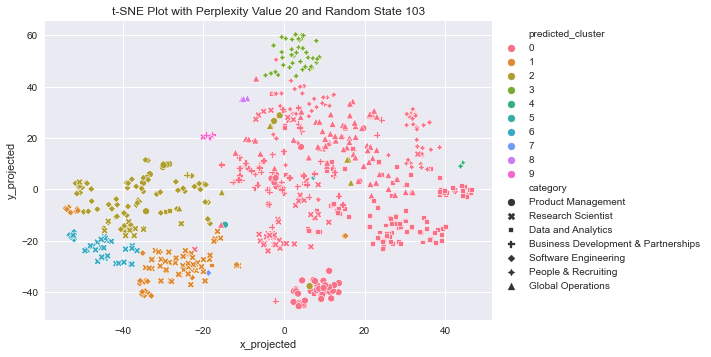

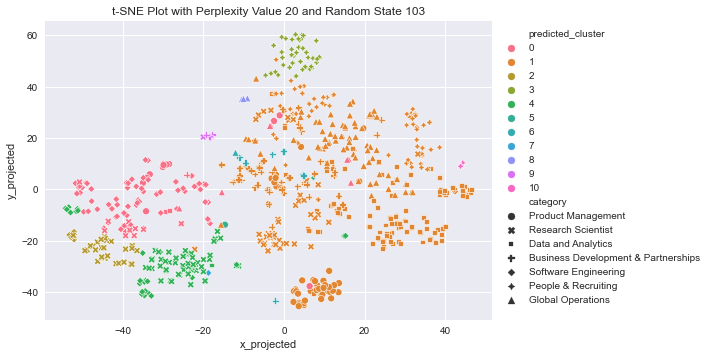

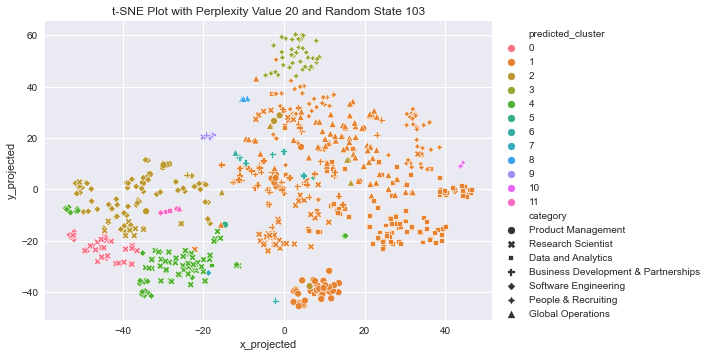

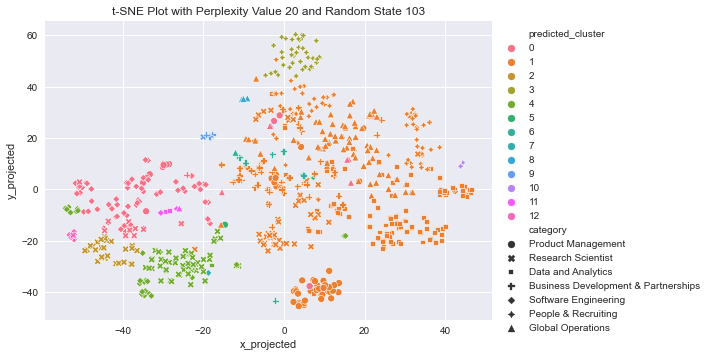

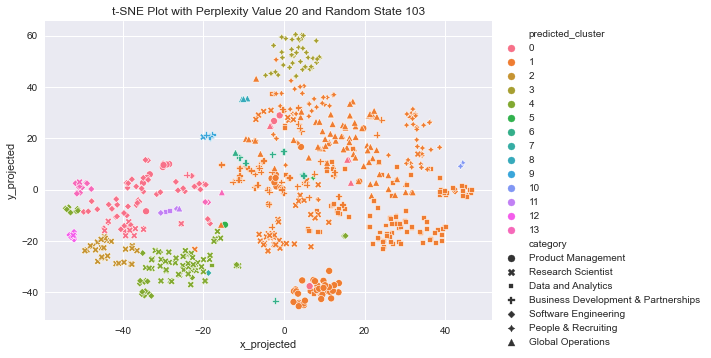

In [268]:
tsne = TSNE(n_components=2, perplexity=20, random_state=103)
data_tsne = tsne.fit_transform(tfidf_matrix_np_info)
df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
df_combo = pd.concat([df, df_tsne], axis=1)
for k in range(2,15):
    #Clustering from dendrogram with k clusters
    hac = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average')
    df_combo['predicted_cluster'] = hac.fit_predict(tfidf_matrix_np_info)
    
    #Map the resulting cluster labels onto our chosen t-SNE plot
    sns.scatterplot(x='x_projected',y='y_projected', hue='predicted_cluster', palette=sns.color_palette("husl", k), style = df['category'], data=df_combo)
    plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(20, 103))
    plt.legend(bbox_to_anchor=(1,1))
    plt.show()

## Hierarchical Agglomerative Clustering with Complete Linkage

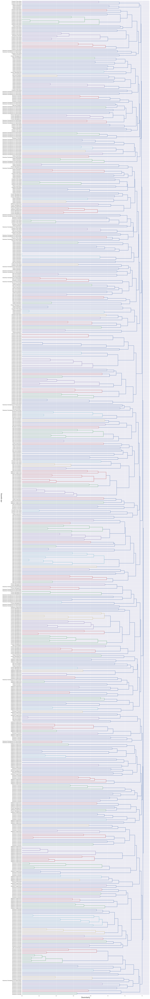

In [269]:
dm = pdist(tfidf_matrix_np_info, metric='euclidean')
Z = linkage(dm, method='complete')

fig, ax = plt.subplots(figsize=(25, 200))
d = dendrogram(Z, orientation='right', labels=df['category'].array, ax=ax)
ax.set_xlabel('Dissimilarity', fontsize=18)
ax.set_ylabel('Job opening', fontsize=18)
plt.yticks(fontsize=12)
plt.show()

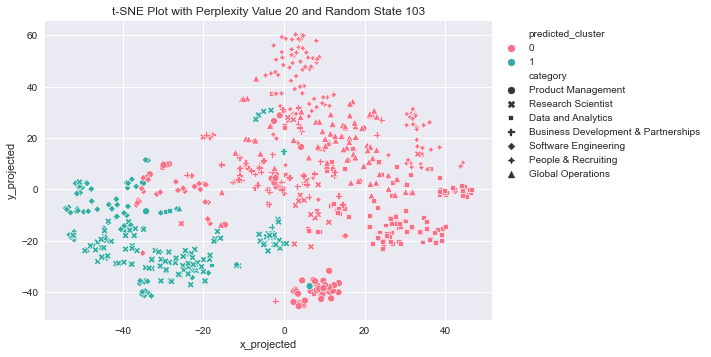

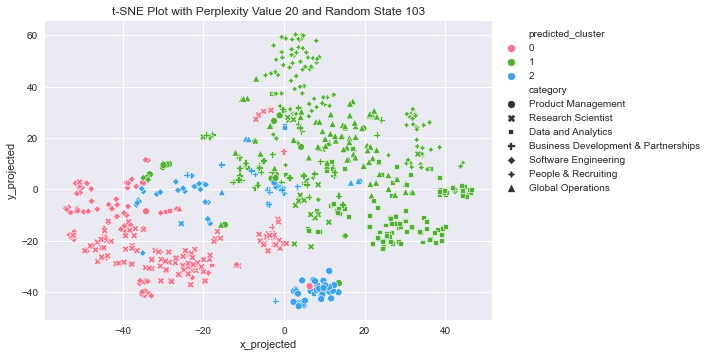

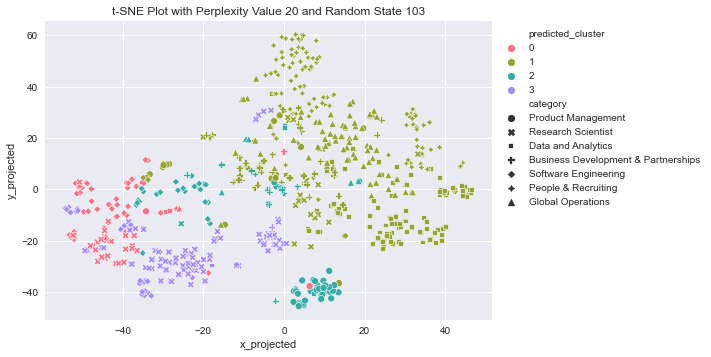

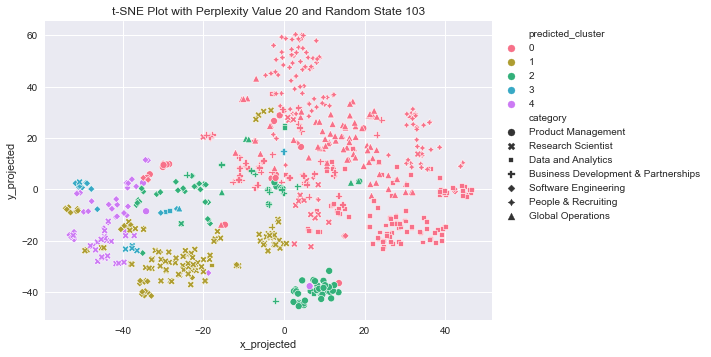

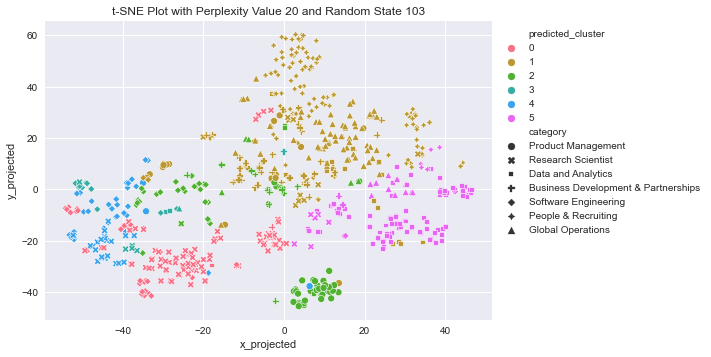

...

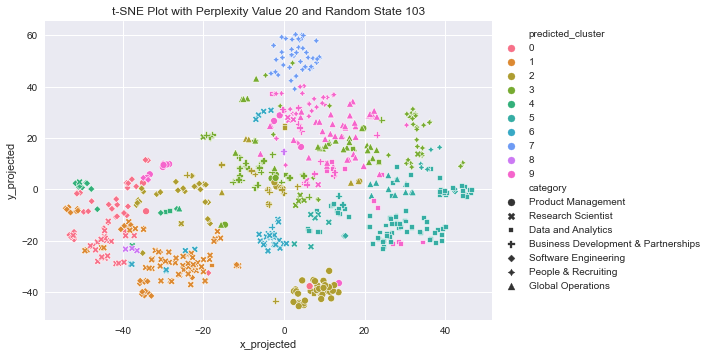

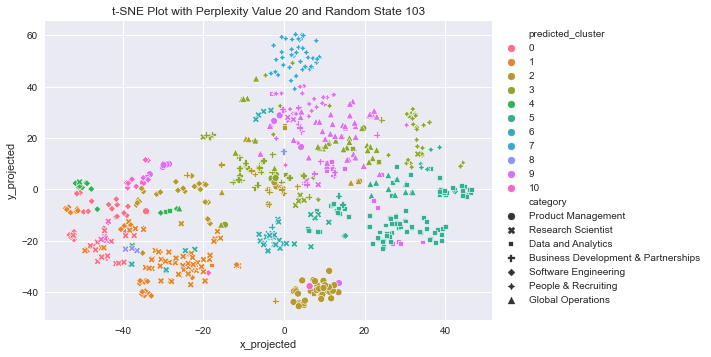

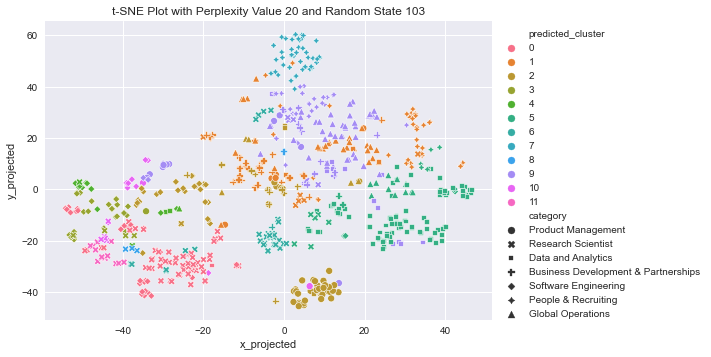

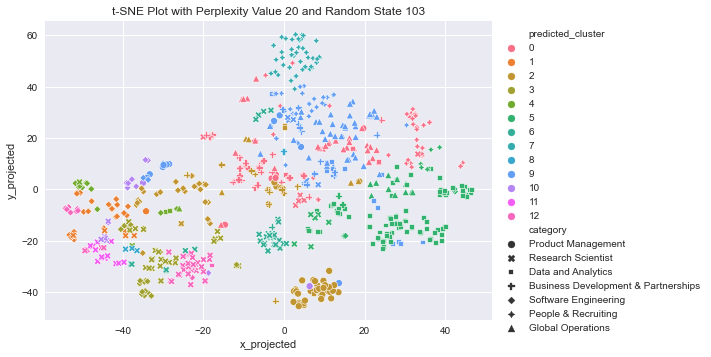

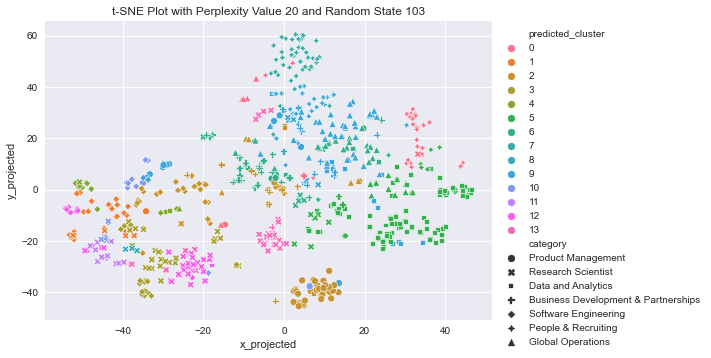

In [270]:
tsne = TSNE(n_components=2, perplexity=20, random_state=103)
data_tsne = tsne.fit_transform(tfidf_matrix_np_info)
df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
df_combo = pd.concat([df, df_tsne], axis=1)
for k in range(2,15):
    #Clustering from dendrogram with k clusters
    hac = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='complete')
    df_combo['predicted_cluster'] = hac.fit_predict(tfidf_matrix_np_info)
    
    #Map the resulting cluster labels onto our chosen t-SNE plot
    sns.scatterplot(x='x_projected',y='y_projected', hue='predicted_cluster', palette=sns.color_palette("husl", k), style = df['category'], data=df_combo)
    plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(20, 103))
    plt.legend(bbox_to_anchor=(1,1))
    plt.show()

## Hierarchical Agglomerative Clustering with Ward's Linkage

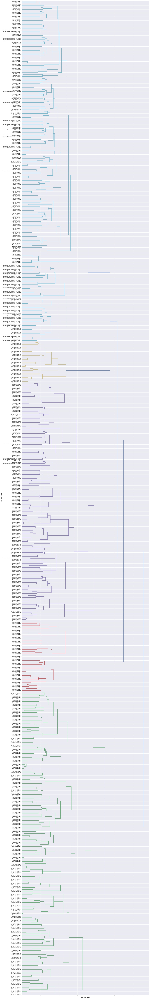

In [271]:
dm = pdist(tfidf_matrix_np_info, metric='euclidean')
Z = linkage(dm, method='ward')

fig, ax = plt.subplots(figsize=(25, 200))
d = dendrogram(Z, orientation='right', labels=df['category'].array, ax=ax)
ax.set_xlabel('Dissimilarity', fontsize=18)
ax.set_ylabel('Job opening', fontsize=18)
plt.yticks(fontsize=12)
plt.show()

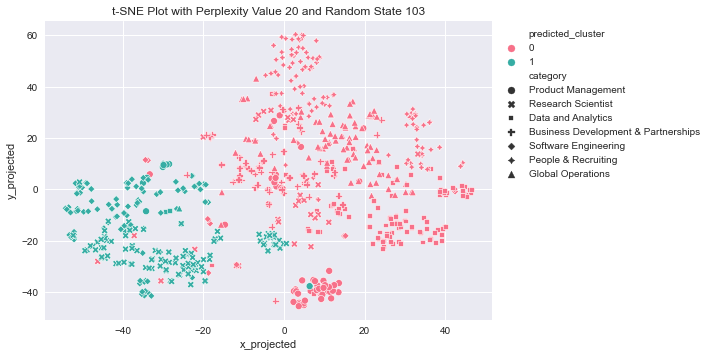

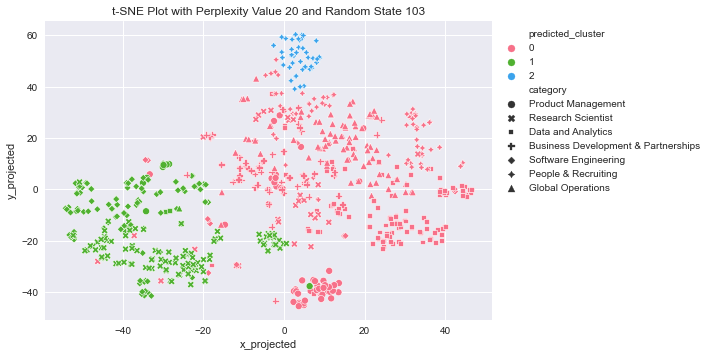

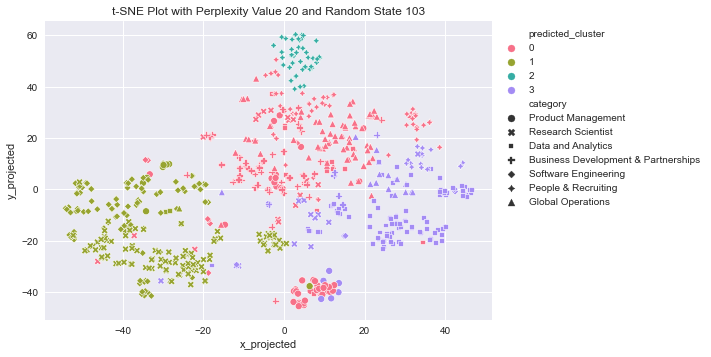

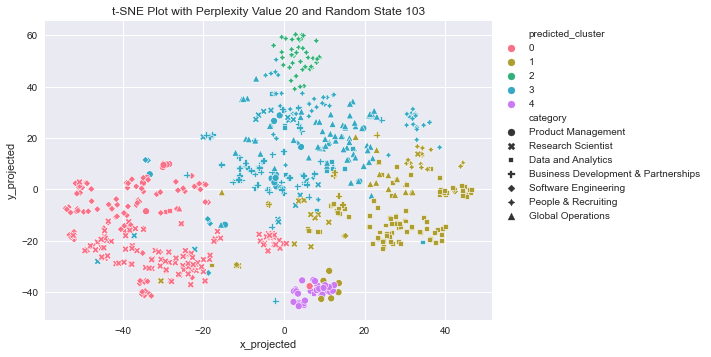

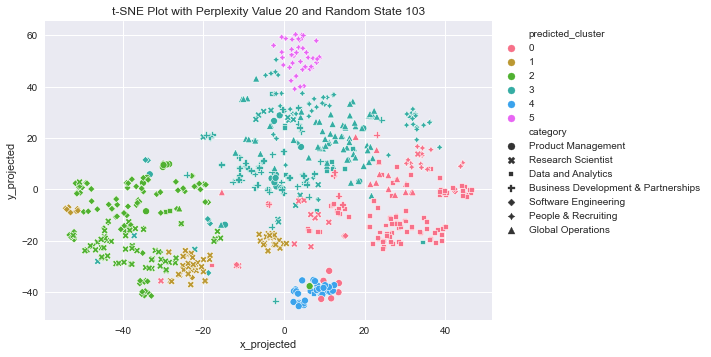

...

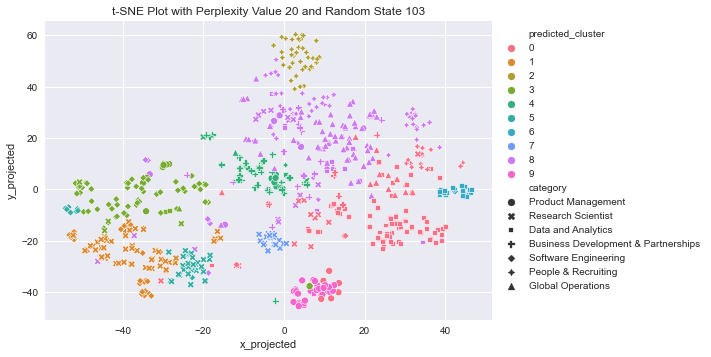

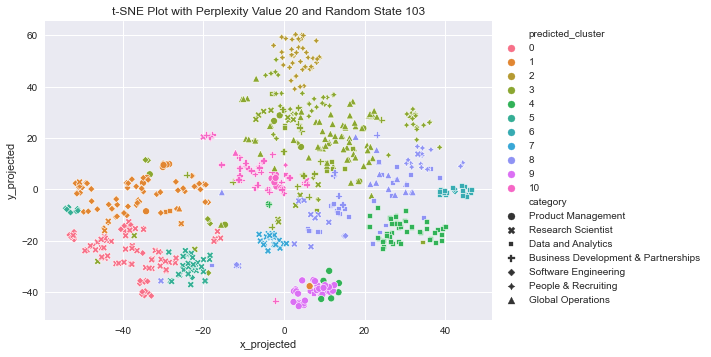

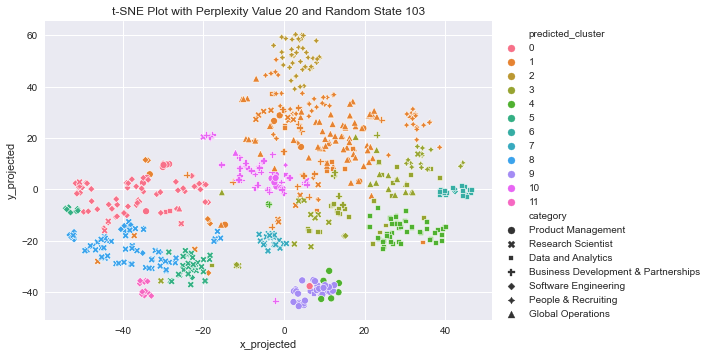

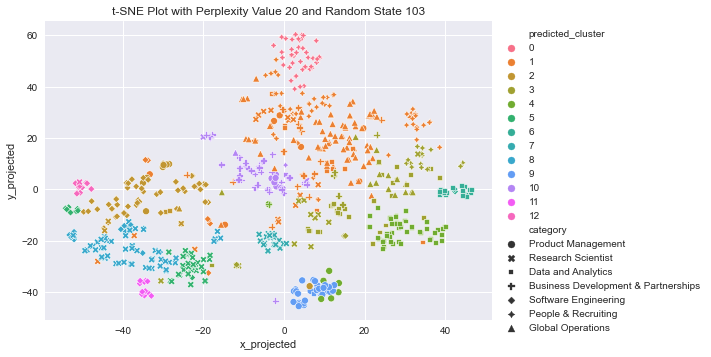

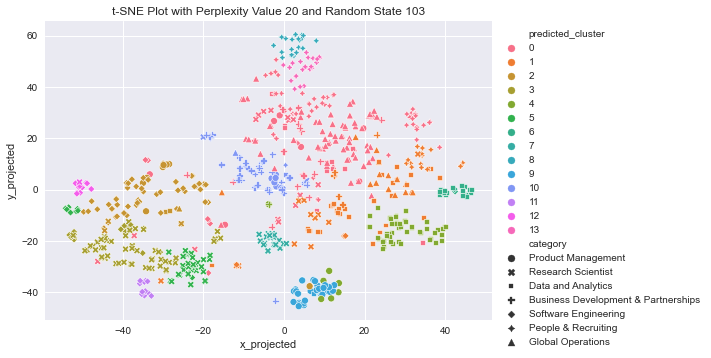

In [272]:
tsne = TSNE(n_components=2, perplexity=20, random_state=103)
data_tsne = tsne.fit_transform(tfidf_matrix_np_info)
df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
df_combo = pd.concat([df, df_tsne], axis=1)
for k in range(2,15):
    #Clustering from dendrogram with k clusters
    hac = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward')
    df_combo['predicted_cluster'] = hac.fit_predict(tfidf_matrix_np_info)
    
    #Map the resulting cluster labels onto our chosen t-SNE plot
    sns.scatterplot(x='x_projected',y='y_projected', hue='predicted_cluster', palette=sns.color_palette("husl", k), style = df['category'], data=df_combo)
    plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(20, 103))
    plt.legend(bbox_to_anchor=(1,1))
    plt.show()

### 7.2. Clustering Algorithm

### 7.3. Clustering Algorithm Results Presentation

### 7.4. Assessing Clustering Separation and Cohesion

### 7.5. Additional Analysis

### 7.6. Describing Each of the Clusters

## 8. Clustering Algorithm 2 (change name to the algorithm you chose)



### 8.1. Parameter Selection

There are two important parameters in LDA:

1. Alpha parameter (what topics a document is about): This parameter is Dirichlet prior concentration parameter which controls document-topic density. Higher the alpha value, more are the topics by which documents are made up of and it results in more specific topic distribution for each document.

2. Beta parameter (what words define a topic): This paramter is prior concentration which controls topic-word density. higher the value of beta, more words are there in the topics and it results in more specific word distribution for each topic.

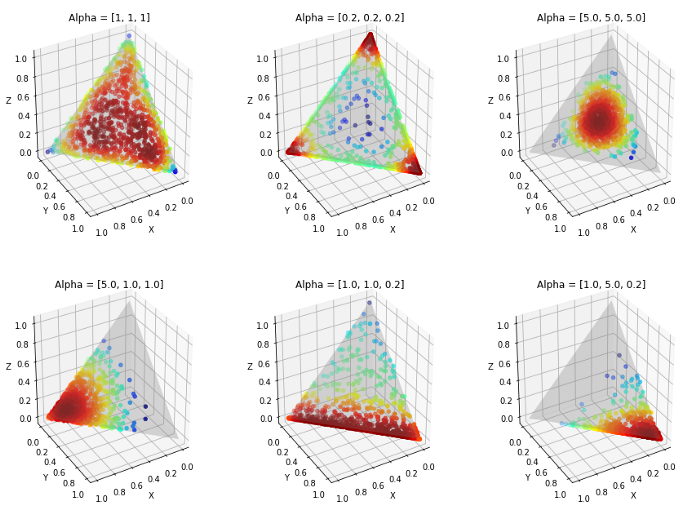

image source: https://towardsdatascience.com/light-on-math-machine-learning-intuitive-guide-to-latent-dirichlet-allocation-437c81220158

To find right values of $\alpha$ and $\beta$ parameters, we need to create multiple models and evaluate these with specific values of $\alpha$ and $\beta$. We can evaluate these moodels either by human judgement or intrinsic evaluation metrics. Evaluating the models by eye balling topic words is not feasible. Hence we need to use an objective metric.

Evaluating topic modeling algorithms based on objective measures has been one of the most difficult task. Perplexity had often been used as an intrinsic evaluation measure. It measures how suprised a model is to new data that it has not seen before. It measures the normalized log-likelihood of a held-out test set. However, recent research has shown that perplexity (predictive likelihood) and human judgement are often do not agree with each other. Hence, topic coherence is an alternative to perplexity that we can use for paramter selection.

**Topic Coherence** scores a single topic based on the degree of semantic similarity between high scoring words in the topic. **Semantic similarity** is the task of determining how similar two words/ sentences are based on thier meaning. A set of sentences or facts are said to be coherent, if they support each other. We will use topic coherence score to select alpha and beta parameters.

In [43]:
cv = CountVectorizer(
    max_df=0.99, # max_df : maximum document frequency for the given word
    max_features=1000, # max_features: maximum number of words
    min_df=0.01, # min_df : minimum document frequency for the given word
    tokenizer=tokenization_and_lemmatization,
    ngram_range=(1,2) # ngram_range: (min, max), eg. (1, 2) including 1-gram, 2-gram
)
count_vect_matrix_np_info = cv.fit_transform(data_information)

In [53]:
temp = pd.DataFrame(data=count_vect_matrix_np_info, columns=cv.get_feature_names())

ValueError: Shape of passed values is (727, 1), indices imply (727, 1000)

In [52]:
cv.get_feature_names()

['able',
 'abuse',
 'academic',
 'access',
 'account',
 'accountability',
 'achieve',
 'achieving',
 'acoustic',
 'across',
 'across company',
 'across different',
 'across facebook',
 'across multiple',
 'across organization',
 'act',
 'action',
 'actionable',
 'actionable insight',
 'activity',
 'ad',
 'address',
 'adoption',
 'advance',
 'advanced',
 'advertiser',
 'advertising',
 'advocate',
 'ai',
 'algorithm',
 'align',
 'alignment',
 'along',
 'ambiguity',
 'ambiguous',
 'among',
 'analysis',
 'analysis data',
 'analysis product',
 'analyst',
 'analytical',
 'analytical solving',
 'analytics',
 'analytics organization',
 'analyze',
 'analyze metric',
 'analyzing',
 'analyzing data',
 'android',
 'api',
 'apis',
 'app',
 'applied',
 'apply',
 'apply expertise',
 'applying',
 'approach',
 'appropriate',
 'ar',
 'ar vr',
 'architecture',
 'area',
 'around',
 'art',
 'ass',
 'assessment',
 'assist',
 'audience',
 'audio',
 'audit',
 'authorization',
 'authorization country',
 'autho

### 8.2. Clustering Algorithm

### 8.3. Clustering Algorithm Results Presentation

### 8.4. Assessing Clustering Separation and Cohesion

### 8.5. Additional Analysis

### 8.6. Describing Each of the Clusters

## 9. Analysis Summary and Conclusion

### 9.1. Algorithm Comparison Summary

#### 9.1.1. Comparing Algorithm Performance

#### 9.1.2. Comparing Algorithm Results

### 9.2. Conclusion and Insights Summary

## 10. Group Contribution Report